<a href="https://colab.research.google.com/github/xinyanLyu/time_series/blob/master/HW4_explore_zillow_data_and_time_series_model_for_SF_housing_price.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Explore Zillow

## Ingest

In [0]:
import pandas as pd
pd.set_option('display.float_format', lambda x: '%.3f' % x)
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns
import seaborn as sns; sns.set(color_codes=True)
from sklearn.cluster import KMeans
color = sns.color_palette()
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
%matplotlib inline

/usr/local/lib/python3.6/dist-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


In [0]:
df = pd.read_csv("https://raw.githubusercontent.com/noahgift/real_estate_ml/master/data/Zip_Zhvi_SingleFamilyResidence_2018.csv")


## EDA

In [0]:
df.describe()

,RegionID,RegionName,SizeRank,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,...,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,2018-10,2018-11,2018-12
count,15508.000,15508.000,15508.000,14338.000,14338.000,14338.000,14338.000,14338.000,14338.000,14338.000,...,15508.000,15508.000,15508.000,15508.000,15508.000,15508.000,15508.000,15508.000,15508.000,15508.000
mean,80789.618,47683.566,7754.500,115889.866,116007.379,116123.051,116235.493,116358.920,116501.681,116689.315,...,279359.582,280672.685,282148.749,283446.447,284466.282,285500.200,286717.307,288029.320,289187.510,290106.635
std,31521.485,29008.034,4476.918,85115.825,85264.209,85413.118,85566.676,85744.243,85958.867,86230.630,...,361868.364,361360.576,363102.089,365301.815,366277.876,367095.613,366772.521,364624.171,361143.146,359132.687
min,58196.000,1001.000,1.000,11300.000,11500.000,11600.000,11800.000,11800.000,12000.000,12100.000,...,21700.000,21700.000,22100.000,22200.000,22000.000,21800.000,21700.000,21500.000,21600.000,21900.000
25%,67215.000,22199.000,3877.750,66700.000,66800.000,66925.000,67100.000,67200.000,67300.000,67500.000,...,128300.000,128800.000,129675.000,130300.000,131100.000,131900.000,132900.000,134000.000,135100.000,135600.000
50%,77886.500,45792.500,7754.500,96500.000,96700.000,96750.000,96900.000,96900.000,97000.000,97150.000,...,191100.000,192150.000,193400.000,194600.000,195700.000,196900.000,198100.000,199600.000,201100.000,202150.000
75%,90314.250,74010.250,11631.250,140500.000,140600.000,140600.000,140800.000,141000.000,141100.000,141300.000,...,310750.000,312300.000,314325.000,316100.000,317425.000,318325.000,319800.000,321200.000,322425.000,323900.000
max,753844.000,99901.000,15508.000,3676700.000,3704200.000,3729600.000,3754600.000,3781800.000,3813500.000,3849600.000,...,17724700.000,17408900.000,17450500.000,17722800.000,18006700.000,18273800.000,18331900.000,18131900.000,17594900.000,17119600.000


#### Clean Up DataFrame
Rename RegionName to ZipCode and Change Zip Code to String 

In [0]:
df.rename(columns={"RegionName":"ZipCode"}, inplace=True)
df["ZipCode"]=df["ZipCode"].map(lambda x: "{:.0f}".format(x))
df["RegionID"]=df["RegionID"].map(lambda x: "{:.0f}".format(x))
df.head()

,RegionID,ZipCode,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,2018-10,2018-11,2018-12
0,84654,60657,Chicago,IL,Chicago-Naperville-Elgin,Cook County,1,334200.000,335400.000,336500.000,...,1037400,1038700,1041500,1042800,1042900,1044400,1047800,1049700,1048300,1047900
1,91982,77494,Katy,TX,Houston-The Woodlands-Sugar Land,Harris County,2,210400.000,212200.000,212200.000,...,330400,332700,334500,335900,337000,338300,338400,336900,336000,336500
2,84616,60614,Chicago,IL,Chicago-Naperville-Elgin,Cook County,3,498100.000,500900.000,503100.000,...,1317900,1321100,1325300,1323800,1321200,1320700,1319500,1318800,1319700,1323300
3,93144,79936,El Paso,TX,El Paso,El Paso County,4,77300.000,77300.000,77300.000,...,120800,121300,122200,123000,123600,124500,125600,126300,126800,127400
4,91940,77449,Katy,TX,Houston-The Woodlands-Sugar Land,Harris County,5,95400.000,95600.000,95800.000,...,175500,176400,176900,176900,177300,178000,178500,179300,180200,180700


In [0]:
median_prices = df.median()
#sf_prices = df["City"] == "San Francisco".median()


**Median USA Prices December, 2018**

In [0]:
median_prices.tail()

2018-08   196900.000
2018-09   198100.000
2018-10   199600.000
2018-11   201100.000
2018-12   202150.000
dtype: float64

In [0]:
sf_df = df[df["City"] == "San Francisco"].median()
df_comparison = pd.concat([sf_df,median_prices], axis=1)
df_comparison.columns = ["San Francisco","Median USA"]
df_comparison.head()


,San Francisco,Median USA
RegionID,97572.000,77886.500
ZipCode,94118.000,45792.500
SizeRank,1315.000,7754.500
1996-04,306900.000,96500.000
1996-05,307600.000,96700.000


### Visualize

In [0]:
!pip uninstall -q -y plotly
!pip install -q plotly
!pip install -q --upgrade cufflinks     #-q mute install log in output

    100% |████████████████████████████████| 38.4MB 1.1MB/s 


In [0]:
def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
  '''))
  init_notebook_mode(connected=False)

In [0]:
from plotly.offline import init_notebook_mode
enable_plotly_in_cell()
init_notebook_mode(connected=False)

import cufflinks as cf
cf.go_offline()
df_comparison.iplot(title="Bay Area Median Single Family Home Prices 1996-2018",
                    xTitle="Year",
                    yTitle="Sales Price",
                   #bestfit=True, bestfit_colors=["pink"],
                   #subplots=True,
                   shape=(4,1),
                    #subplot_titles=True,
                    fill=True,)

### Cluster on Size Rank and Price


In [0]:
from sklearn.preprocessing import MinMaxScaler

In [0]:
columns_to_drop = ['RegionID', 'ZipCode', 'City', 'State', 'Metro', 'CountyName']
df_numerical = df.dropna()
df_numerical = df_numerical.drop(columns_to_drop, axis=1)

In [0]:
df_numerical.describe()

,SizeRank,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,1996-11,1996-12,...,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,2018-10,2018-11,2018-12
count,13254.000,13254.000,13254.000,13254.000,13254.000,13254.000,13254.000,13254.000,13254.000,13254.000,...,13254.000,13254.000,13254.000,13254.000,13254.000,13254.000,13254.000,13254.000,13254.000,13254.000
mean,7209.201,119843.979,119964.886,120083.967,120200.023,120327.735,120475.887,120670.394,120896.748,121239.875,...,296637.596,298087.355,299639.037,300985.220,302016.350,303017.074,304232.096,305623.276,306889.113,307909.642
std,4415.323,86787.386,86943.535,87100.133,87261.531,87447.615,87671.976,87955.472,88287.690,88726.163,...,324511.156,325590.838,326899.476,327797.537,327909.039,327991.275,328048.196,327854.154,327338.204,327477.529
min,1.000,11400.000,11500.000,11600.000,11800.000,11800.000,12000.000,12100.000,12200.000,12300.000,...,21700.000,21700.000,22100.000,22600.000,23100.000,23700.000,24300.000,24400.000,24400.000,24600.000
25%,3393.250,70000.000,70100.000,70300.000,70400.000,70600.000,70800.000,71000.000,71200.000,71400.000,...,139100.000,139900.000,140725.000,141625.000,142600.000,143300.000,144225.000,145600.000,146700.000,147400.000
50%,6902.500,100750.000,100800.000,100800.000,101000.000,101000.000,101100.000,101200.000,101300.000,101400.000,...,208200.000,209700.000,211050.000,212700.000,213950.000,214900.000,216250.000,217800.000,219100.000,220000.000
75%,10921.750,144500.000,144600.000,144700.000,144800.000,144900.000,144975.000,145200.000,145500.000,145900.000,...,336300.000,337975.000,339900.000,341100.000,342000.000,342975.000,344275.000,345800.000,347750.000,348975.000
max,15508.000,3676700.000,3704200.000,3729600.000,3754600.000,3781800.000,3813500.000,3849600.000,3888900.000,3928800.000,...,7494200.000,7529400.000,7534400.000,7494600.000,7417200.000,7395700.000,7265400.000,6917500.000,6692700.000,6671700.000


In [0]:
scaler = MinMaxScaler()
scaled_df = scaler.fit_transform(df_numerical)
kmeans = KMeans(n_clusters=3, random_state=0).fit(scaled_df)
print(len(kmeans.labels_))

/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/data.py:323: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.



13254


In [0]:
cluster_df = df.copy(deep=True)
cluster_df.dropna(inplace=True)
cluster_df.describe()
cluster_df['cluster'] = kmeans.labels_
cluster_df['appreciation_ratio'] = round(cluster_df["2017-09"]/cluster_df["1996-04"],2)
cluster_df['CityZipCodeAppRatio'] = cluster_df['City'].map(str) + "-" + cluster_df['ZipCode'] + "-" + cluster_df["appreciation_ratio"].map(str)
cluster_df.head()

,RegionID,ZipCode,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2018-06,2018-07,2018-08,2018-09,2018-10,2018-11,2018-12,cluster,appreciation_ratio,CityZipCodeAppRatio
0,84654,60657,Chicago,IL,Chicago-Naperville-Elgin,Cook County,1,334200.000,335400.000,336500.000,...,1042800,1042900,1044400,1047800,1049700,1048300,1047900,1,3.020,Chicago-60657-3.02
1,91982,77494,Katy,TX,Houston-The Woodlands-Sugar Land,Harris County,2,210400.000,212200.000,212200.000,...,335900,337000,338300,338400,336900,336000,336500,0,1.520,Katy-77494-1.52
2,84616,60614,Chicago,IL,Chicago-Naperville-Elgin,Cook County,3,498100.000,500900.000,503100.000,...,1323800,1321200,1320700,1319500,1318800,1319700,1323300,1,2.590,Chicago-60614-2.59
3,93144,79936,El Paso,TX,El Paso,El Paso County,4,77300.000,77300.000,77300.000,...,123000,123600,124500,125600,126300,126800,127400,0,1.550,El Paso-79936-1.55
4,91940,77449,Katy,TX,Houston-The Woodlands-Sugar Land,Harris County,5,95400.000,95600.000,95800.000,...,176900,177300,178000,178500,179300,180200,180700,0,1.760,Katy-77449-1.76


In [0]:
import plotly.offline as py
import plotly.graph_objs as go
enable_plotly_in_cell()
trace1 = go.Scatter3d(
    x=cluster_df["appreciation_ratio"],
    y=cluster_df["1996-04"],
    z=cluster_df["2017-09"],
    mode='markers',
    text=cluster_df["CityZipCodeAppRatio"],
    marker=dict(
        size=12,
        color=cluster_df["cluster"],                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)
#print(trace1)
data = [trace1]
layout = go.Layout(
    showlegend=False,
    title="30 Year History USA Real Estate Prices (Clusters Colored)",
    scene = dict(
        xaxis = dict(title='X: Appreciation Ratio'),
        yaxis = dict(title="Y:  1996 Prices"),
        zaxis = dict(title="Z:  2017 Prices"),
    ),
    width=1000,
    height=900,
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='3d-scatter-colorscale')

## Modeling - Linear regression

In [0]:
sfall_df = df[df["City"] == "San Francisco"]
sfall_df.head()

,RegionID,ZipCode,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,2018-10,2018-11,2018-12
9,97564,94109,San Francisco,CA,San Francisco-Oakland-Hayward,San Francisco County,10,766000.000,771100.000,776500.000,...,3761200,3810600,3876700,3942300,3982900,3993000,3999000,4014600,4009500,4016600
79,97565,94110,San Francisco,CA,San Francisco-Oakland-Hayward,San Francisco County,80,213900.000,214800.000,216000.000,...,1566500,1592600,1625200,1645500,1651200,1653600,1656100,1654100,1643000,1637100
348,97576,94122,San Francisco,CA,San Francisco-Oakland-Hayward,San Francisco County,349,278400.000,278300.000,278400.000,...,1396800,1405900,1417800,1430000,1441500,1449700,1457300,1463500,1460200,1456700
525,97567,94112,San Francisco,CA,San Francisco-Oakland-Hayward,San Francisco County,526,210100.000,210200.000,210300.000,...,1024500,1030500,1038500,1047300,1055300,1064600,1079100,1096700,1110100,1119700
776,97569,94115,San Francisco,CA,San Francisco-Oakland-Hayward,San Francisco County,777,794000.000,796500.000,799000.000,...,4135600,4149700,4169900,4194500,4222100,4238300,4236100,4241700,4231700,4221300


In [0]:
sfall_df.shape

(19, 280)

From the EDA， we clearly see that there is a upward trend in San Francisco, so we only keep the sales price in last 1 year to fit a model. 

In [0]:
#drop['RegionID', 'ZipCode', 'City', 'State', 'Metro', 'CountyName']#
sf_tem_df =sfall_df.drop(sfall_df.columns[0:6],axis=1) 
sf_tem_df.head()

,SizeRank,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,1996-11,1996-12,...,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,2018-10,2018-11,2018-12
9,10,766000.000,771100.000,776500.000,781900.000,787300.000,793000.000,799100.000,805800.000,814400.000,...,3761200,3810600,3876700,3942300,3982900,3993000,3999000,4014600,4009500,4016600
79,80,213900.000,214800.000,216000.000,217500.000,219200.000,221200.000,223700.000,226500.000,229900.000,...,1566500,1592600,1625200,1645500,1651200,1653600,1656100,1654100,1643000,1637100
348,349,278400.000,278300.000,278400.000,278800.000,279400.000,280300.000,281700.000,283500.000,285800.000,...,1396800,1405900,1417800,1430000,1441500,1449700,1457300,1463500,1460200,1456700
525,526,210100.000,210200.000,210300.000,210600.000,210900.000,211300.000,212000.000,212900.000,214200.000,...,1024500,1030500,1038500,1047300,1055300,1064600,1079100,1096700,1110100,1119700
776,777,794000.000,796500.000,799000.000,801800.000,804600.000,807700.000,811400.000,815800.000,822400.000,...,4135600,4149700,4169900,4194500,4222100,4238300,4236100,4241700,4231700,4221300


In [0]:
sf_temp_df =sf_tem_df.drop(sf_tem_df.columns[1:262],axis=1)
sf_temp_df.head()

,SizeRank,2018-01,2018-02,2018-03,2018-04,2018-05,2018-06,2018-07,2018-08,2018-09,2018-10,2018-11,2018-12
9,10,3754200,3751700,3761200,3810600,3876700,3942300,3982900,3993000,3999000,4014600,4009500,4016600
79,80,1532100,1547100,1566500,1592600,1625200,1645500,1651200,1653600,1656100,1654100,1643000,1637100
348,349,1378500,1388900,1396800,1405900,1417800,1430000,1441500,1449700,1457300,1463500,1460200,1456700
525,526,1009900,1017900,1024500,1030500,1038500,1047300,1055300,1064600,1079100,1096700,1110100,1119700
776,777,4111200,4127500,4135600,4149700,4169900,4194500,4222100,4238300,4236100,4241700,4231700,4221300


In [0]:
df1= sf_temp_df.drop(sf_temp_df.columns[2:], axis=1)
df2=  pd.concat( [sf_temp_df.iloc[:,0],sf_temp_df.iloc[:, 2]], axis=1 )
df3=  pd.concat( [sf_temp_df.iloc[:,0],sf_temp_df.iloc[:, 3]], axis=1 )
df4=  pd.concat( [sf_temp_df.iloc[:,0],sf_temp_df.iloc[:, 4]], axis=1 )
df5=  pd.concat( [sf_temp_df.iloc[:,0],sf_temp_df.iloc[:, 5]], axis=1 )
df6=  pd.concat( [sf_temp_df.iloc[:,0],sf_temp_df.iloc[:, 6]], axis=1 )
df7=  pd.concat( [sf_temp_df.iloc[:,0],sf_temp_df.iloc[:, 7]], axis=1 )
df8=  pd.concat( [sf_temp_df.iloc[:,0],sf_temp_df.iloc[:, 8]], axis=1 )
df9=  pd.concat( [sf_temp_df.iloc[:,0],sf_temp_df.iloc[:, 9]], axis=1 )
df10=  pd.concat( [sf_temp_df.iloc[:,0],sf_temp_df.iloc[:, 10]], axis=1 )
df11=  pd.concat( [sf_temp_df.iloc[:,0],sf_temp_df.iloc[:, 11]], axis=1 )
df12=  pd.concat( [sf_temp_df.iloc[:,0],sf_temp_df.iloc[:, 12]], axis=1 )


sf18_df=df1.append([df2,df3,df4,df5,df6,df7,df8,df9,df10,df11,df12])
sf18_df.head(20)

NameError: ignored

###fit linear model

In [0]:
from sklearn import linear_model
from sklearn.model_selection import train_test_split

In [0]:
y = df12['2018-12'].values #Target
y = y.reshape(-1, 1)
X = df12['SizeRank'].values #Feature(s)
X = X.reshape(-1,1)

In [0]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(14, 1) (14, 1)
(5, 1) (5, 1)


###prediction

In [0]:
lm = linear_model.LinearRegression()
model = lm.fit(X_train, y_train)
predictions = lm.predict(X_test)

In [0]:
model.score(X_test, y_test)

0.06416613892602518

In [0]:
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn import metrics
scores = cross_val_score(model, X, y, cv=19) 
scores

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0.])

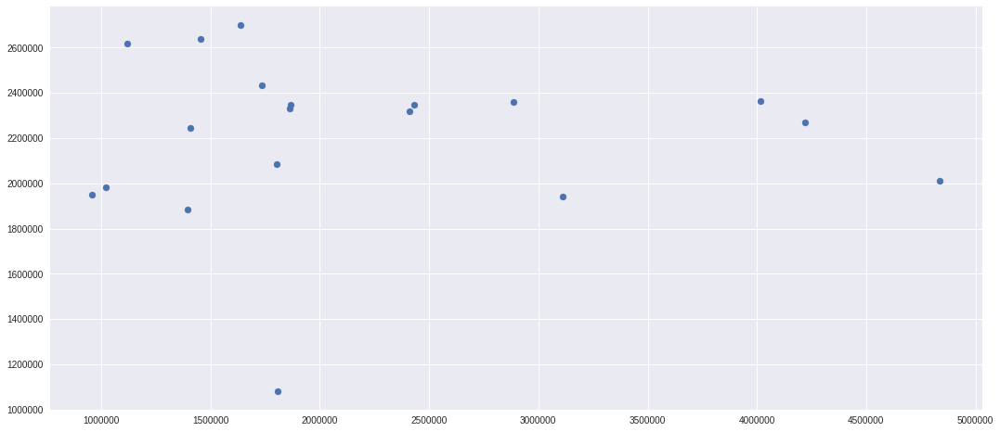

In [0]:
predictions = cross_val_predict(model, X, y, cv=19)
plt.scatter(y, predictions)

## Modeling-Time series





*   Create a time series forecast
*flok reference: https://github.com/aarshayj/Analytics_Vidhya/blob/master/Articles/Time_Series_Analysis/Time_Series_AirPassenger.ipynb



In [0]:
#simple time series forecast
df_transposed = df.transpose()
df_transposed.head(10)

,0,1,2,3,4,5,6,7,8,9,...,15498,15499,15500,15501,15502,15503,15504,15505,15506,15507
RegionID,84654,91982,84616,93144,91940,91733,61807,84640,62037,97564,...,94711,62556,99032,62697,99074,58333,59107,75672,93733,95851
ZipCode,60657,77494,60614,79936,77449,77084,10467,60640,11226,94109,...,84781,12429,97028,12720,97102,1338,3293,40404,81225,89155
City,Chicago,Katy,Chicago,El Paso,Katy,Houston,New York,Chicago,New York,San Francisco,...,Pine Valley,Esopus,Rhododendron,Bethel,Arch Cape,Buckland,Woodstock,Berea,Mount Crested Butte,Mesquite
State,IL,TX,IL,TX,TX,TX,NY,IL,NY,CA,...,UT,NY,OR,NY,OR,MA,NH,KY,CO,NV
Metro,Chicago-Naperville-Elgin,Houston-The Woodlands-Sugar Land,Chicago-Naperville-Elgin,El Paso,Houston-The Woodlands-Sugar Land,Houston-The Woodlands-Sugar Land,New York-Newark-Jersey City,Chicago-Naperville-Elgin,New York-Newark-Jersey City,San Francisco-Oakland-Hayward,...,St. George,Kingston,Portland-Vancouver-Hillsboro,NaN,Astoria,Greenfield Town,Claremont-Lebanon,Richmond-Berea,NaN,Las Vegas-Henderson-Paradise
CountyName,Cook County,Harris County,Cook County,El Paso County,Harris County,Harris County,Bronx County,Cook County,Kings County,San Francisco County,...,Washington County,Ulster County,Clackamas County,Sullivan County,Clatsop County,Franklin County,Grafton County,Madison County,Gunnison County,Clark County
SizeRank,1,2,3,4,5,6,7,8,9,10,...,15499,15500,15501,15502,15503,15504,15505,15506,15507,15508
1996-04,334200.000,210400.000,498100.000,77300.000,95400.000,95000.000,152900.000,216500.000,162000.000,766000.000,...,135900.000,78300.000,136200.000,62500.000,182600.000,94600.000,92700.000,57100.000,191100.000,176400.000
1996-05,335400.000,212200.000,500900.000,77300.000,95600.000,95200.000,152700.000,216700.000,162300.000,771100.000,...,136300.000,78300.000,136600.000,62600.000,183700.000,94300.000,92500.000,57300.000,192400.000,176300.000
1996-06,336500.000,212200.000,503100.000,77300.000,95800.000,95400.000,152600.000,216900.000,162600.000,776500.000,...,136600.000,78200.000,136800.000,62700.000,184800.000,94000.000,92400.000,57500.000,193700.000,176100.000


In [0]:
type(sf_df)
sf_df.index


Index(['RegionID', 'ZipCode', 'SizeRank', '1996-04', '1996-05', '1996-06',
       '1996-07', '1996-08', '1996-09', '1996-10',
       ...
       '2018-03', '2018-04', '2018-05', '2018-06', '2018-07', '2018-08',
       '2018-09', '2018-10', '2018-11', '2018-12'],
      dtype='object', length=276)

In [0]:
sf=sf_df.drop(['RegionID', 'ZipCode', 'SizeRank'])
sf.head()

1996-04   306900.000
1996-05   307600.000
1996-06   308400.000
1996-07   309300.000
1996-08   310500.000
dtype: float64

In [0]:
#convert to time series:

ts = sf
ts.head()

1996-04   306900.000
1996-05   307600.000
1996-06   308400.000
1996-07   309300.000
1996-08   310500.000
dtype: float64

In [0]:
ts.index

Index(['1996-04', '1996-05', '1996-06', '1996-07', '1996-08', '1996-09',
       '1996-10', '1996-11', '1996-12', '1997-01',
       ...
       '2018-03', '2018-04', '2018-05', '2018-06', '2018-07', '2018-08',
       '2018-09', '2018-10', '2018-11', '2018-12'],
      dtype='object', length=273)

###Check Stationary

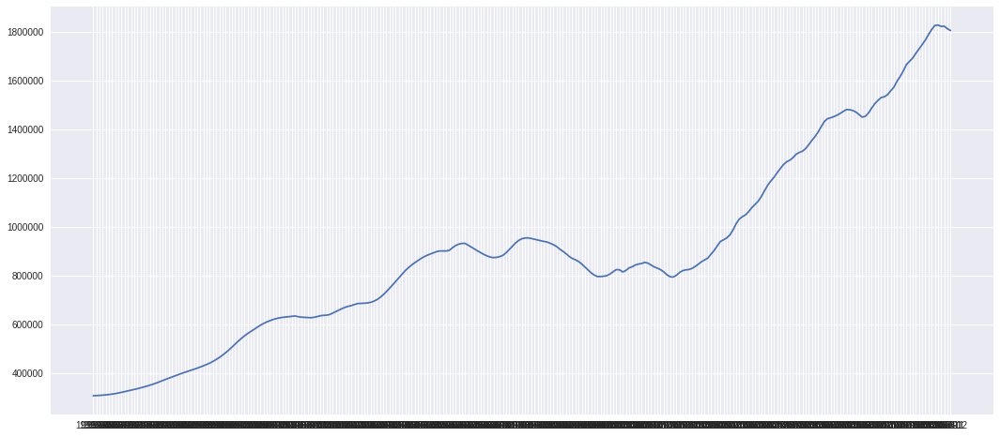

In [0]:
plt.rcParams['figure.figsize'] = (18.0, 8.0)
plt.plot(ts)

In [0]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries):
    
    #Determing rolling statistics
    rolmean = pd.rolling_mean(timeseries, window=12)
    rolstd = pd.rolling_std(timeseries, window=12)

    #Plot rolling statistics:
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print(f'Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: FutureWarning:

pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning:

pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()



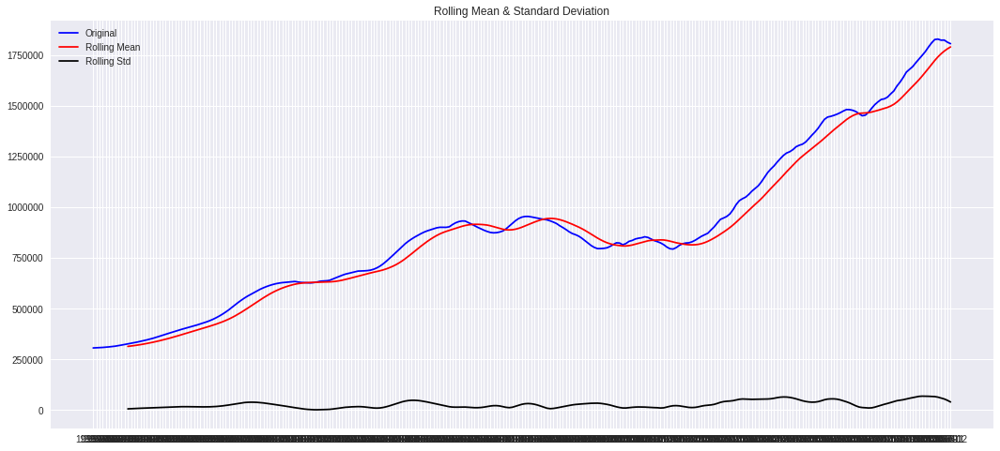

Results of Dickey-Fuller Test:
Test Statistic                  0.145
p-value                         0.969
#Lags Used                     14.000
Number of Observations Used   258.000
Critical Value (1%)            -3.456
Critical Value (5%)            -2.873
Critical Value (10%)           -2.573
dtype: float64


In [0]:
test_stationarity(ts)

###Estimating & Eliminating Trend

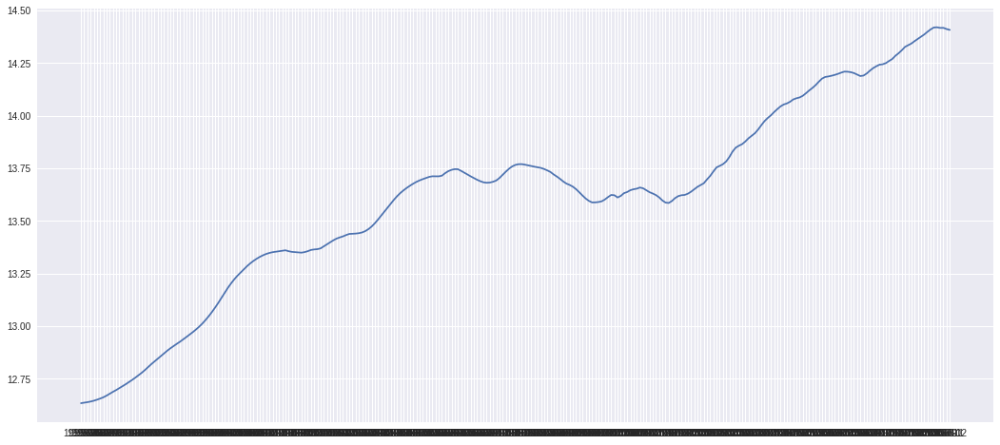

In [0]:
ts_log = np.log(ts)
plt.plot(ts_log)

###Smoothing

####-Moving average

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()



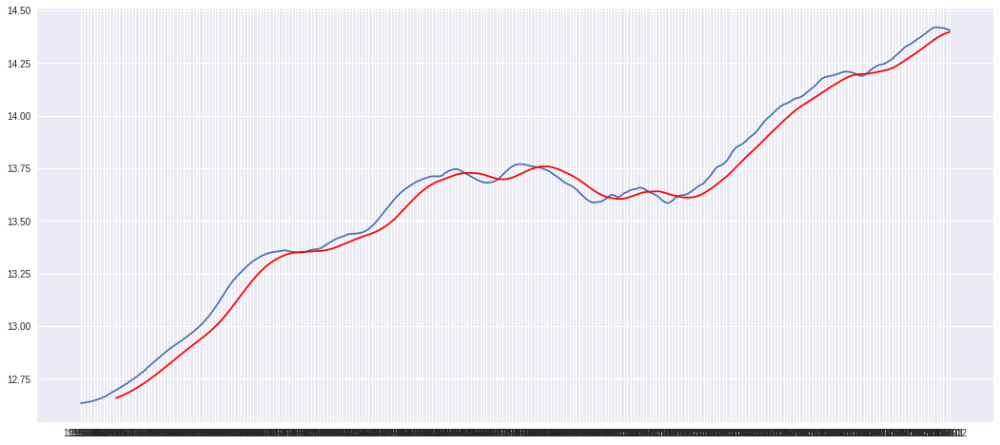

In [0]:
moving_avg = pd.rolling_mean(ts_log,12)
plt.plot(ts_log)
plt.plot(moving_avg, color='red')

In [0]:
#get differneces sseries from log and moving average- the distance of two lines which is showed in th above chart
ts_log_moving_avg_diff = ts_log - moving_avg
ts_log_moving_avg_diff.head(12) 

1996-04     nan
1996-05     nan
1996-06     nan
1996-07     nan
1996-08     nan
1996-09     nan
1996-10     nan
1996-11     nan
1996-12     nan
1997-01     nan
1997-02     nan
1997-03   0.038
dtype: float64

In [0]:
#drop first 11 months' null values
ts_log_moving_avg_diff.dropna(inplace=True)
ts_log_moving_avg_diff.head()

1997-03   0.038
1997-04   0.041
1997-05   0.044
1997-06   0.046
1997-07   0.049
dtype: float64

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: FutureWarning:

pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning:

pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()



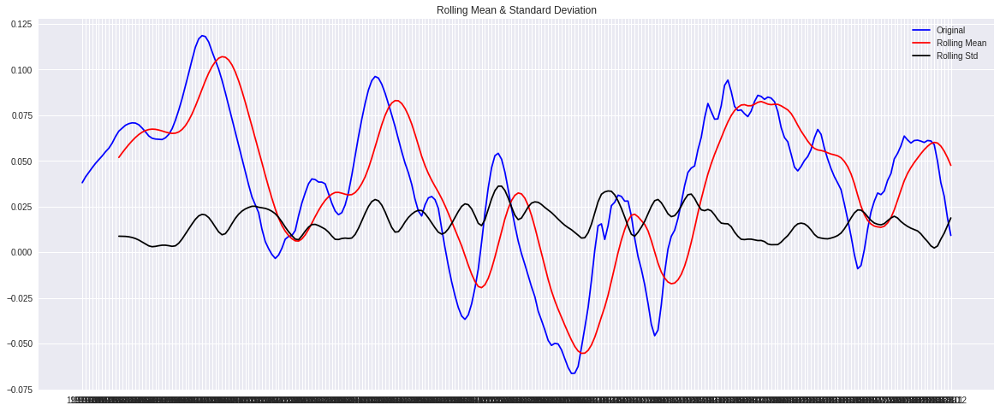

Results of Dickey-Fuller Test:
Test Statistic                 -2.800
p-value                         0.058
#Lags Used                      6.000
Number of Observations Used   255.000
Critical Value (1%)            -3.456
Critical Value (5%)            -2.873
Critical Value (10%)           -2.573
dtype: float64


In [0]:
# test again
test_stationarity(ts_log_moving_avg_diff) 

####-Exponentially Weighted Moving Average

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning:

pd.ewm_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.ewm(halflife=12,min_periods=0,adjust=True,ignore_na=False).mean()



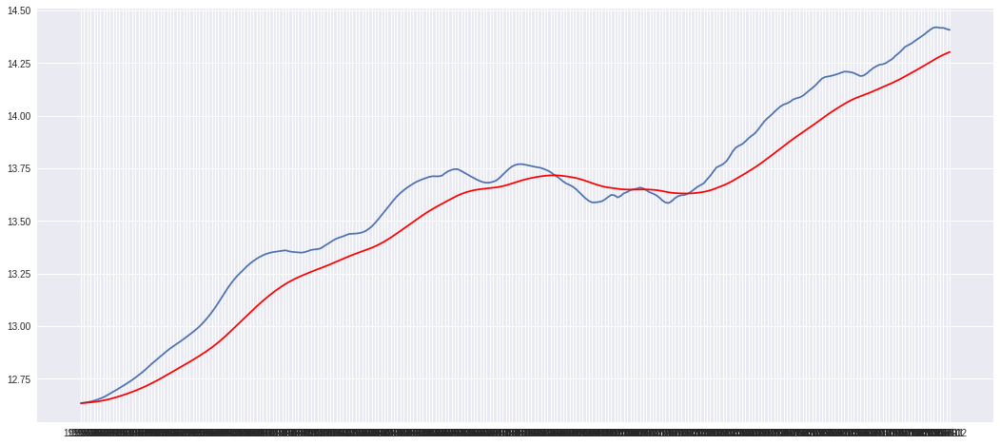

In [0]:
expwighted_avg = pd.ewma(ts_log, halflife=12)
plt.plot(ts_log)
plt.plot(expwighted_avg, color='red')
# expwighted_avg.plot(style='k--')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: FutureWarning:

pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning:

pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()



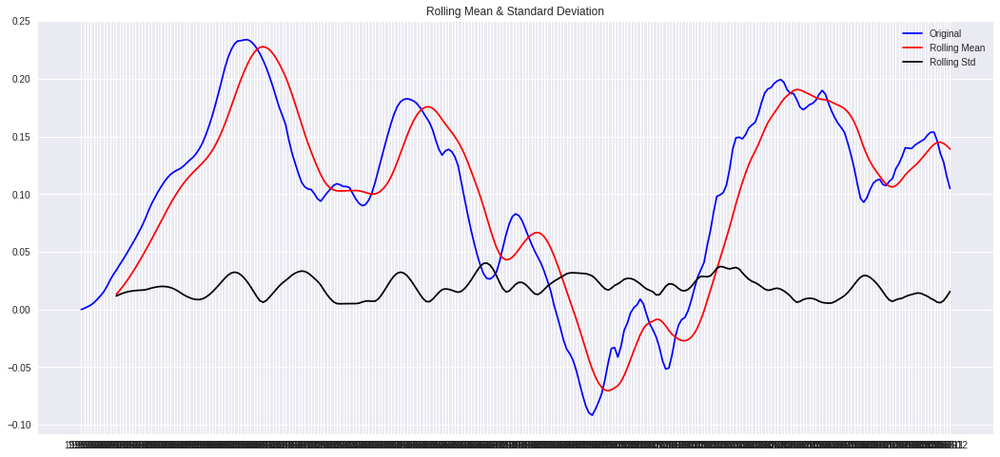

Results of Dickey-Fuller Test:
Test Statistic                 -2.517
p-value                         0.111
#Lags Used                      7.000
Number of Observations Used   265.000
Critical Value (1%)            -3.455
Critical Value (5%)            -2.873
Critical Value (10%)           -2.573
dtype: float64


In [0]:
#test again
ts_log_ewma_diff = ts_log - expwighted_avg
test_stationarity(ts_log_ewma_diff)

###Eliminating Trend and Seasonality

####Differencing

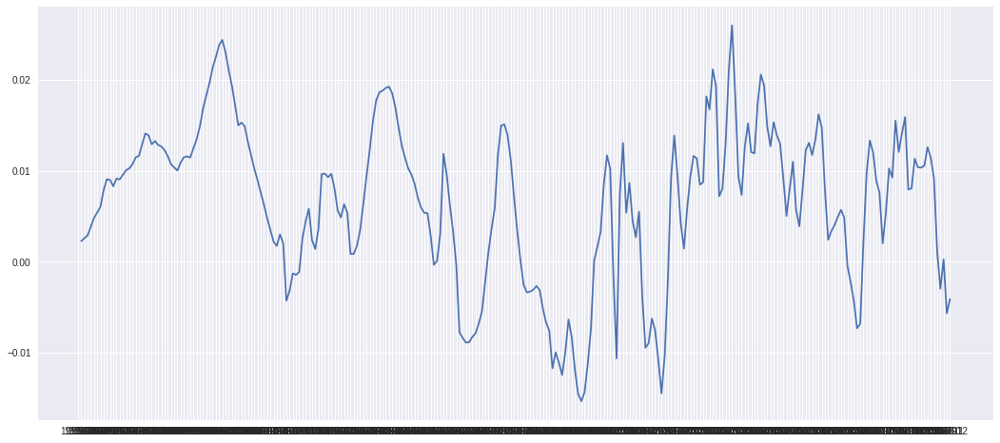

In [0]:
#first differencing:
ts_log_diff = ts_log - ts_log.shift()
plt.plot(ts_log_diff)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: FutureWarning:

pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).mean()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning:

pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=12,center=False).std()



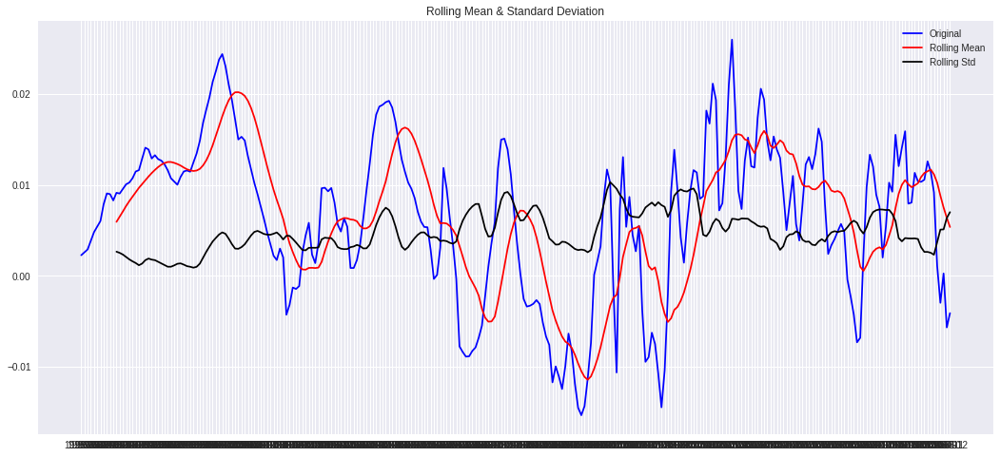

Results of Dickey-Fuller Test:
Test Statistic                 -3.341
p-value                         0.013
#Lags Used                      6.000
Number of Observations Used   265.000
Critical Value (1%)            -3.455
Critical Value (5%)            -2.873
Critical Value (10%)           -2.573
dtype: float64


In [0]:
ts_log_diff.dropna(inplace=True)
test_stationarity(ts_log_diff)

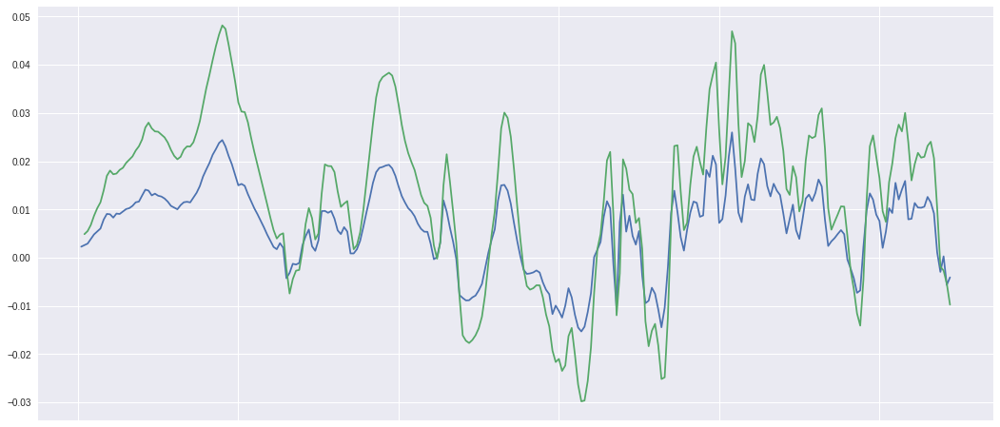

In [0]:
ts_log_diff1 = ts_log.diff(1)   #1st difference
ts_log_diff2 = ts_log.diff(2)    #second difference
ts_log_diff1.plot()
ts_log_diff2.plot()
plt.show()  #since the variance of first difference is acceptable at α=5%, and second difference doesn't change the variance too much, we could keep d=1 

###Arima model building

In [0]:
from statsmodels.tsa.arima_model import ARIMA

####Using ACF,PACF to estimate parameter of ARIMA（p，d，q）

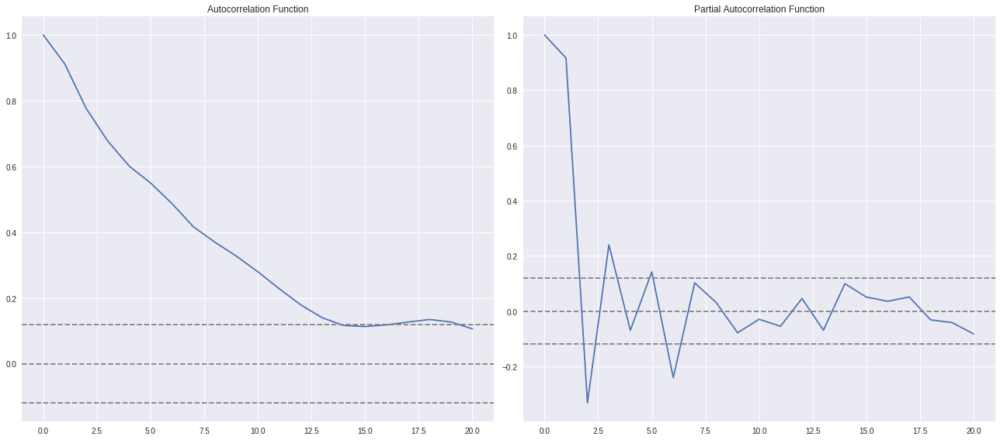

In [0]:
###Since the variance at first difference is acceptable at α=5%, that is after first difference, the data is stationary . So we estimate d=1.
#ACF and PACF plots:
from statsmodels.tsa.stattools import acf, pacf  

lag_acf = acf(ts_log_diff, nlags=20)
lag_pacf = pacf(ts_log_diff, nlags=20, method='ols')

#Plot ACF:    
plt.subplot(121)    
plt.plot(lag_acf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(ts_log_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(ts_log_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')

#Plot PACF:
plt.subplot(122)
plt.plot(lag_pacf)
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(ts_log_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(ts_log_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.tight_layout()

From this two charts, we can estimate p=14, q=2.

####Fit Arima model

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:646: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:650: FutureWarning:

Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:496: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/kalmanf/kalmanfilter.py:577: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



Text(0.5, 1.0, 'RSS: 0.0024')

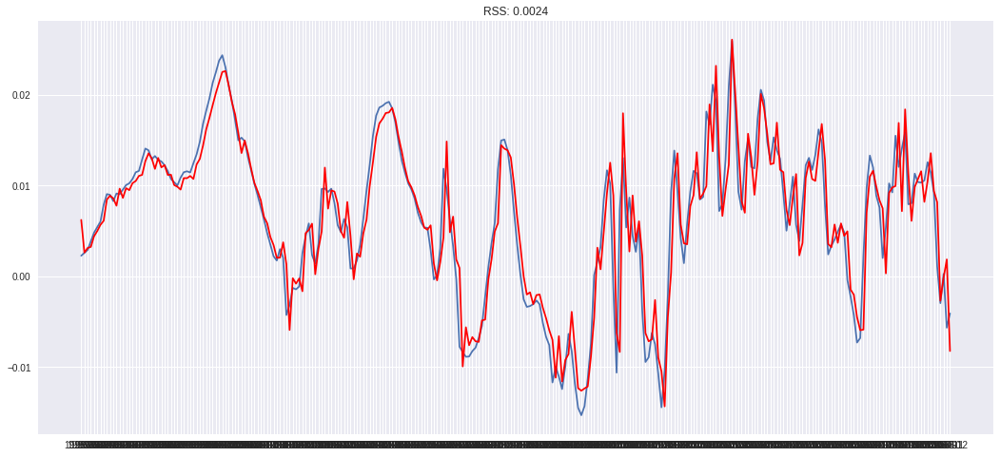

In [0]:

arima_model = ARIMA(ts_log,order=(14, 1, 2))
results_AR = arima_model.fit(disp=-1)

plt.plot(ts_log_diff)
plt.plot(results_AR.fittedvalues, color='red')
plt.title('RSS: %.4f'% sum((results_AR.fittedvalues-ts_log_diff)**2))


### converting back and prediction

In [0]:
predictions_ARIMA_diff = pd.Series(results_AR.fittedvalues, copy=True)
print(predictions_ARIMA_diff.head())

1996-05   0.006
1996-06   0.003
1996-07   0.003
1996-08   0.003
1996-09   0.004
dtype: float64


In [0]:
predictions_ARIMA_diff_cumsum = predictions_ARIMA_diff.cumsum()
print(predictions_ARIMA_diff_cumsum.head())

1996-05   0.006
1996-06   0.009
1996-07   0.012
1996-08   0.015
1996-09   0.020
dtype: float64


In [0]:
predictions_ARIMA_log = pd.Series(ts_log.ix[0], index=ts_log.index)
predictions_ARIMA_log = predictions_ARIMA_log.add(predictions_ARIMA_diff_cumsum,fill_value=0)
predictions_ARIMA_log.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated



1996-04   12.634
1996-05   12.641
1996-06   12.643
1996-07   12.646
1996-08   12.650
dtype: float64

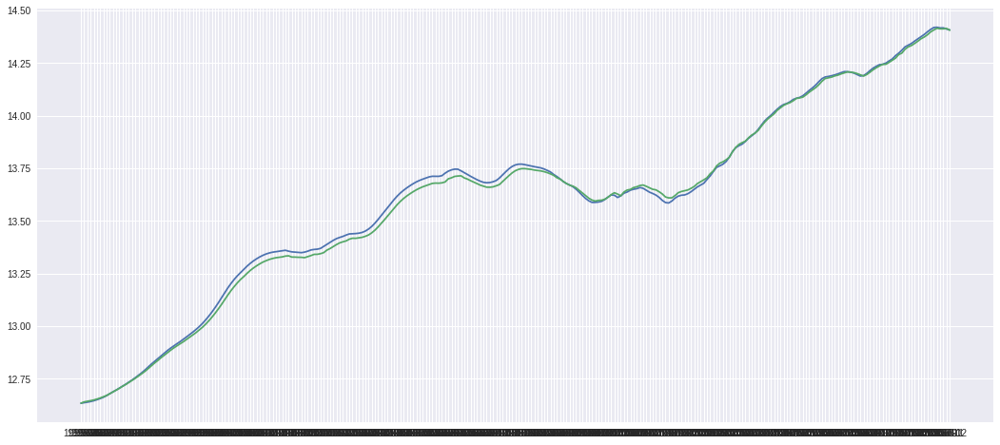

In [0]:
plt.plot(ts_log)
plt.plot(predictions_ARIMA_log)

Text(0.5, 1.0, 'RMSE: 15961.7336')

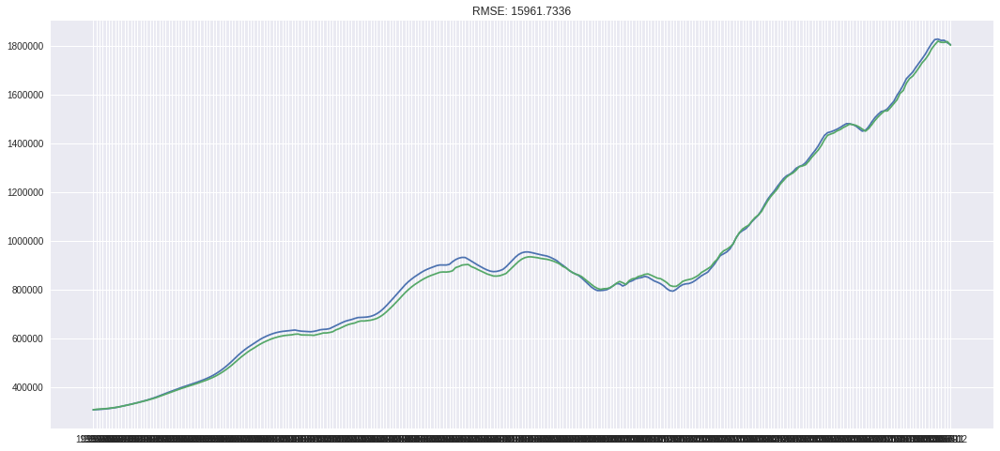

In [0]:
predictions_ARIMA = np.exp(predictions_ARIMA_log)
plt.plot(ts)
plt.plot(predictions_ARIMA)
plt.title('RMSE: %.4f'% np.sqrt(sum((predictions_ARIMA-ts)**2)/len(ts)))

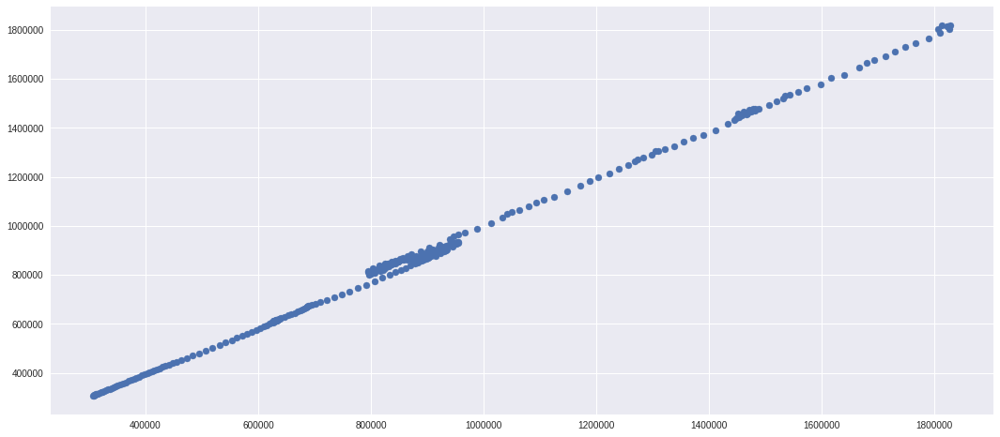

In [0]:
plt.scatter(ts, predictions_ARIMA)


## Conclusion



*   What did you find out from the two models?
*   What pricing prediction can you make?

